In [1]:
import modules.data_preparation.v1.ETLData as dp
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import numpy as np
from menelaus.data_drift import KdqTreeStreaming
import warnings
warnings.filterwarnings('ignore')

from sktime import datasets
from sktime.forecasting import model_selection
from sktime.utils.plotting import plot_series
import plotly.graph_objects as go
import plotly.express as px

#from statsmodels.tsa.seasonal import seasonal_decompose
from scipy import optimize
from statsmodels.tsa.seasonal import seasonal_decompose
from dateutil.parser import parse
import xgboost as xgb
from sklearn.preprocessing import OneHotEncoder

import calendar
from sklearn.metrics import r2_score
from sklearn.decomposition import PCA
from mpl_toolkits import mplot3d
%matplotlib inline

# 1. Data Preprocessing

- Transformation Functions

In [2]:
# computation functions
efficiency_fn = (lambda e_in, e_out: e_out/e_in)
efficiency_over_in_fn = (lambda e_in, e_out: e_out/(e_in*e_in))
log_fn = (lambda x: np.log(x)) # will be applied to efficiency and efficiency_over_in

- Loading Data and Initial Formatting

In [3]:
# load dataset
#dataset = dp.ETLData('../data/dataset1.csv')
dataset = dp.ETLData('../data/telecom_paris_dataset.xlsx', sheet_name='data')

In [4]:
# numeric, positive and timeseries formatting
(
dataset.filter_by_column_value('energy_input_in_mwh', lambda x: x>0)
    .filter_by_column_value('energy_output_in_mwh', lambda x: x>0)
    .to_timeseries('timestamp_local')
)

- Filtering Data

In [5]:
# filtering out 5th and 95th quantile of IN and OUT
energy_in_5_quantile = dataset.get_data()['energy_input_in_mwh'].quantile(.05)
energy_out_5_quantile = dataset.get_data()['energy_output_in_mwh'].quantile(.05)

energy_in_95_quantile = dataset.get_data()['energy_input_in_mwh'].quantile(.95)
energy_out_95_quantile = dataset.get_data()['energy_output_in_mwh'].quantile(.95)

(
    dataset.filter_by_column_value('energy_input_in_mwh', lambda x: x>energy_in_5_quantile)
    .filter_by_column_value('energy_output_in_mwh', lambda x: x>energy_out_5_quantile)
    .filter_by_column_value('energy_input_in_mwh', lambda x: x<energy_in_95_quantile)
    .filter_by_column_value('energy_output_in_mwh', lambda x: x<energy_out_95_quantile)
)

- Computing Columns

In [6]:
# compute efficiency

dataset.compute_column(column_name='efficiency', fn_arg_col_names=['energy_input_in_mwh', 'energy_output_in_mwh'], fn_compute=efficiency_fn)

In [7]:
# compute percentage charge
max_energy_output = max(dataset.get_data()['energy_output_in_mwh'])

percentage_charge_fn = (lambda energy_output, max_energy_output: energy_output / max_energy_output)

dataset.compute_column(column_name='percentage_charge', fn_arg_col_names=['energy_output_in_mwh'], fn_compute=percentage_charge_fn, additional_args=[max_energy_output])

- Load Temperature Data

In [8]:
# load temperature data
#dataset.load_temperature_data('../data/', timestamp_column_name='dateHrLwt', temperature_column_name='surfaceTemperatureCelsius')
dataset.load_temperature_data('../data/telecom_paris_dataset.xlsx', timestamp_column_name='dateHrLwt', temperature_column_name='surfaceTemperatureCelsius', numeric_format=False)

dataset.rename_column({'surfaceTemperatureCelsius': 'temperature'})

- Month Feature

In [9]:
dataset.get_month_features()

- Chillers

In [10]:
dataset.get_data()[['equipment_id']].value_counts()

equipment_id                       
eq_it049959b_chiller_compression_03    8710
eq_it049959b_chiller_compression_04    7394
eq_it049959b_chiller_compression_05    5700
eq_it049959b_chiller_compression_01    4134
eq_it049959b_chiller_compression_02    4069
eq_it0_chiller_compression_03          1948
eq_it0_chiller_compression_04          1747
eq_it019820w_chiller_compression_04     956
eq_it0_chiller_compression_02           695
eq_it019820w_chiller_compression_05      49
dtype: int64

### Change Chiller Name Here !!!

In [11]:
EQUIPEMENT_ID = 'eq_it049959b_chiller_compression_03'

In [12]:
# read chiller data
chiller_data = dataset.filter_by_column_value('equipment_id', lambda x: x==EQUIPEMENT_ID, save=False)
chiller_data = chiller_data.drop(['building_id', 'equipment_type', 'equipment_type_and_sub_type', 'equipment_id'], axis=1)

In [13]:
chiller_data.head(3)

,energy_input_in_mwh,energy_output_in_mwh,efficiency,percentage_charge,temperature,jan,feb,mar,apr,may,jun,jul,aug,sep,oct,nov,dec
2021-01-01 01:00:00,0.13675,0.740,5.411335,0.230458,4.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-01-01 02:00:00,0.14100,0.751,5.326241,0.233884,4.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2021-01-01 03:00:00,0.12150,0.641,5.275720,0.199626,4.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [14]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=chiller_data.index, y=chiller_data['efficiency'], mode='markers', name='error'))

fig.update_layout(title='EFFICIENCY', xaxis_title='timestamp', yaxis_title='')
fig.show()

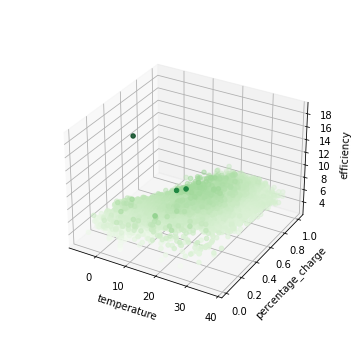

In [27]:
%matplotlib widget
fig = plt.figure(figsize=(5, 5))
ax = plt.axes(projection='3d')
ax.set_xlabel('temperature')
ax.set_ylabel('percentage_charge')
ax.set_zlabel('efficiency')
xdata=chiller_data['temperature']
ydata=chiller_data['percentage_charge']
zdata=chiller_data['efficiency']
ax.scatter3D(xdata, ydata, zdata, c=zdata, cmap='Greens');

In [18]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=chiller_data['temperature'], y=chiller_data['efficiency'], mode='markers', name='error'))

fig.update_layout(title='EFFICIENCY vs Temperature', xaxis_title='temperature', yaxis_title='efficiency')
fig.show()

In [19]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=chiller_data['percentage_charge'], y=chiller_data['efficiency'], mode='markers', name='error'))

fig.update_layout(title='EFFICIENCY vs percentage_charge', xaxis_title='percentage_charge', yaxis_title='efficiency')
fig.show()

In [21]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=chiller_data['temperature'], y=chiller_data['percentage_charge'], mode='markers', name='error'))

fig.update_layout(title='Percentage Charge vs Temperature', xaxis_title='temperature', yaxis_title='percentage_charge')
fig.show()

# PCA
- pca sensitive to feature scaling
- project my data 

In [16]:
pca = PCA(n_components=3)
pca.fit(chiller_data[['efficiency', 'percentage_charge', 'temperature']])
print(pca.explained_variance_ratio_)

[9.91770441e-01 8.06620348e-03 1.63355233e-04]


In [22]:
pca_data = pca.transform(chiller_data[['efficiency', 'percentage_charge', 'temperature']])

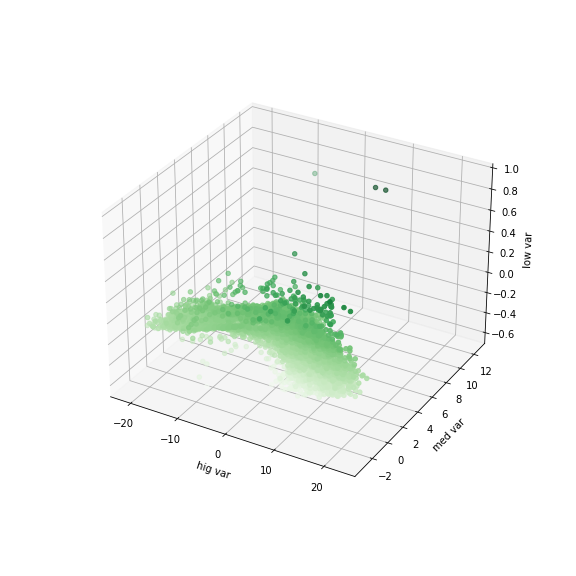

In [34]:
%matplotlib widget
fig = plt.figure(figsize=(8, 8))
ax = plt.axes(projection='3d')
ax.set_xlabel('hig var')
ax.set_ylabel('med var')
ax.set_zlabel('low var')
high_var_data=[sample[0] for sample in pca_data]
med_var_data=[sample[1] for sample in pca_data]
low_var_data=[sample[2] for sample in pca_data]
#ax.scatter3D(xdata, ydata, zdata, c=zdata, cmap='Greens');
ax.scatter3D(high_var_data, med_var_data, low_var_data, c=low_var_data, cmap='Greens');

In [35]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=high_var_data, y=low_var_data, mode='markers', name='error'))

fig.update_layout(title='High vs low (temp vs eff)', xaxis_title='high', yaxis_title='low')
fig.show()

In [36]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=med_var_data, y=low_var_data, mode='markers', name='error'))

fig.update_layout(title='Med vs low (charge vs eff)', xaxis_title='med', yaxis_title='low')
fig.show()

In [37]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=high_var_data, y=med_var_data, mode='markers', name='error'))

fig.update_layout(title='high vs med (temp vs charge)', xaxis_title='high', yaxis_title='med')
fig.show()

# Transformed Time Series Visualisation

In [38]:
print(pca.explained_variance_ratio_)

[9.91770441e-01 8.06620348e-03 1.63355233e-04]


In [41]:
pca.components_[0]

array([0.01982134, 0.01659289, 0.99966584])

In [45]:
ts_high_var = chiller_data[['efficiency', 'percentage_charge', 'temperature']] @ pca.components_[0].T
ts_med_var = chiller_data[['efficiency', 'percentage_charge', 'temperature']] @ pca.components_[1].T
ts_low_var = chiller_data[['efficiency', 'percentage_charge', 'temperature']] @ pca.components_[2].T

In [44]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=ts_high_var.index, y=ts_high_var.values, mode='markers', name='error'))

fig.update_layout(title='Highest Variance', xaxis_title='timestamp', yaxis_title='')
fig.show()

In [49]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=chiller_data.index, y=chiller_data['temperature'], mode='markers', name='error'))

fig.update_layout(title='Temperature', xaxis_title='timestamp', yaxis_title='')
fig.show()

In [46]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=ts_med_var.index, y=ts_med_var.values, mode='markers', name='error'))

fig.update_layout(title='Medium Variance', xaxis_title='timestamp', yaxis_title='')
fig.show()

In [50]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=chiller_data.index, y=chiller_data['efficiency'], mode='markers', name='error'))

fig.update_layout(title='Efficiency', xaxis_title='timestamp', yaxis_title='')
fig.show()

In [48]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=ts_low_var.index, y=ts_low_var.values, mode='markers', name='error'))

fig.update_layout(title='Low Variance', xaxis_title='timestamp', yaxis_title='')
fig.show()

In [51]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=chiller_data.index, y=chiller_data['percentage_charge'], mode='markers', name='error'))

fig.update_layout(title='percentage_charge', xaxis_title='timestamp', yaxis_title='')
fig.show()